Code adapted from Felicia Ong (https://github.com/feliciaosy/zb4171_district13/blob/main/xenium_WT25.ipynb)

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq

In [2]:
adata = sc.read_10x_h5("Xenium_V1_hHeart_nondiseased_section_FFPE_outs/cell_feature_matrix.h5")

In [17]:
adata

AnnData object with n_obs × n_vars = 25726 × 377
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts'

In [4]:
df = pd.read_csv("Xenium_V1_hHeart_nondiseased_section_FFPE_outs/cells.csv.gz", compression="gzip")

In [5]:
df

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area
0,aaaceakg-1,835.042725,797.648987,67,0,0,0,0,67,412.908765,14.043594
1,aaaddlck-1,654.000610,844.252563,84,0,0,0,0,84,552.622208,10.024688
2,aaaebcid-1,664.674683,865.730225,44,0,0,1,0,45,284.348917,10.927813
3,aaaeejcj-1,675.825928,850.887756,98,0,0,0,0,98,537.043301,36.712033
4,aaahoahg-1,690.794983,872.801575,73,0,0,0,0,73,487.552049,40.685783
...,...,...,...,...,...,...,...,...,...,...,...
26361,oioehaij-1,1858.070557,4292.130371,46,0,0,0,0,46,192.275319,45.562658
26362,oiofflob-1,1869.372681,4281.323730,130,0,0,0,0,130,746.252215,69.224534
26363,oioflmpd-1,1864.789062,4311.125977,65,0,0,0,0,65,362.333763,33.957501
26364,oiohpmcb-1,1866.909424,4328.659668,88,0,0,0,0,88,447.227516,27.545313


In [6]:
df.set_index(adata.obs_names, inplace=True)
adata.obs = df.copy()

In [7]:
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()

In [8]:
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area
aaaceakg-1,aaaceakg-1,835.042725,797.648987,67,0,0,0,0,67,412.908765,14.043594
aaaddlck-1,aaaddlck-1,654.000610,844.252563,84,0,0,0,0,84,552.622208,10.024688
aaaebcid-1,aaaebcid-1,664.674683,865.730225,44,0,0,1,0,45,284.348917,10.927813
aaaeejcj-1,aaaeejcj-1,675.825928,850.887756,98,0,0,0,0,98,537.043301,36.712033
aaahoahg-1,aaahoahg-1,690.794983,872.801575,73,0,0,0,0,73,487.552049,40.685783
...,...,...,...,...,...,...,...,...,...,...,...
oioehaij-1,oioehaij-1,1858.070557,4292.130371,46,0,0,0,0,46,192.275319,45.562658
oiofflob-1,oiofflob-1,1869.372681,4281.323730,130,0,0,0,0,130,746.252215,69.224534
oioflmpd-1,oioflmpd-1,1864.789062,4311.125977,65,0,0,0,0,65,362.333763,33.957501
oiohpmcb-1,oiohpmcb-1,1866.909424,4328.659668,88,0,0,0,0,88,447.227516,27.545313


In [9]:
adata.to_df()

,ABCC11,ACE2,ACKR1,ACTA2,ACTG2,ADAM28,ADAMTS1,ADGRE1,ADGRL4,ADH1C,...,TRAC,TREM2,TSPAN19,UBE2C,UMOD,UPK3B,VCAN,VSIG4,VWA5A,VWF
aaaceakg-1,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
aaaddlck-1,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aaaebcid-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aaaeejcj-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
aaahoahg-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oioehaij-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0
oiofflob-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
oioflmpd-1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
oiohpmcb-1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


### Quality control and preprocessing

In [10]:
sc.pp.calculate_qc_metrics(adata, percent_top=(10, 20, 50, 150), inplace=True)

In [11]:
cprobes = (adata.obs["control_probe_counts"].sum() / adata.obs["total_counts"].sum() * 100)
cwords = (adata.obs["control_codeword_counts"].sum() / adata.obs["total_counts"].sum() * 100)
print(f"Negative DNA probe count % : {cprobes}")
print(f"Negative decoding count % : {cwords}")

Negative DNA probe count % : 0.011357544838983484
Negative decoding count % : 0.0026885009522231436


/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprec

<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

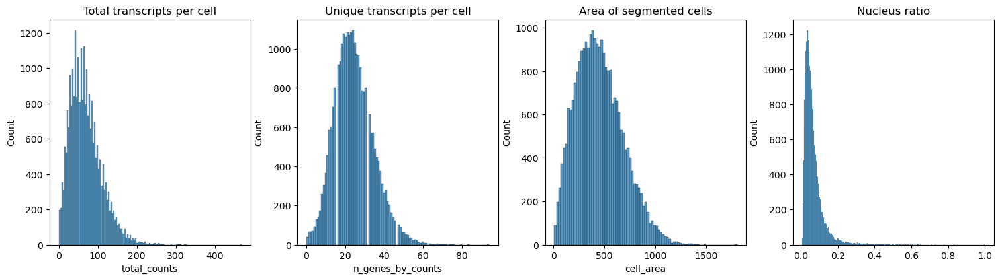

In [13]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
fig.tight_layout(w_pad=2)

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)


axs[2].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

In [14]:
sc.pp.filter_cells(adata, min_counts=10) # filter out cells with fewer than 10 transcripts
sc.pp.filter_genes(adata, min_cells=5) # filter out genes detected in fewer than 5 cells

In [16]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

### Dimensionality reduction and clustering

In [18]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


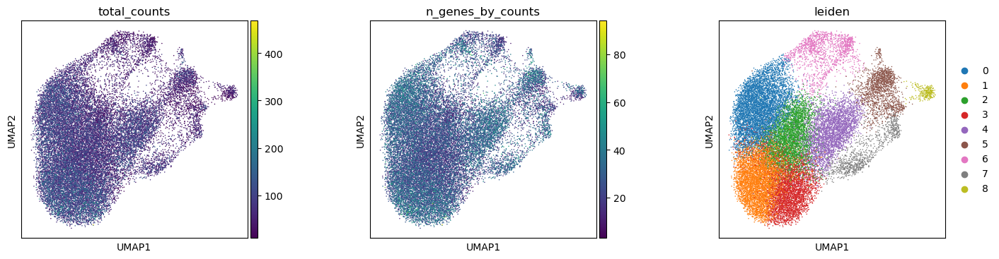

In [19]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "leiden"], wspace=0.4)

In [20]:
sc.tl.leiden(adata, resolution=0.8, key_added='leiden_08')

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


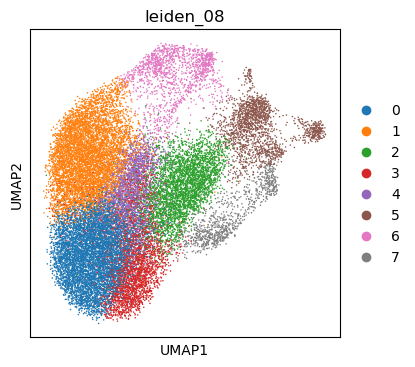

In [21]:
sc.pl.umap(adata, color=["leiden_08"], wspace=0.4)

In [22]:
sc.tl.leiden(adata, resolution=0.6, key_added='leiden_06')

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


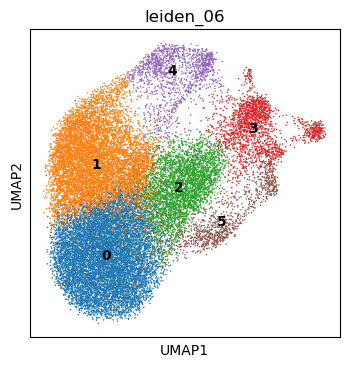

In [28]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["leiden_06"], legend_loc='on data', wspace=0.4)

Use Leiden clustering with 6 clusters.

### Spatial visualisation

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:744: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if c is not None and c in adata.obs and is_categorical_dtype(adata.obs[c]):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:472: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:650: FutureWarning: is_categorical_dtype is deprecated and will b

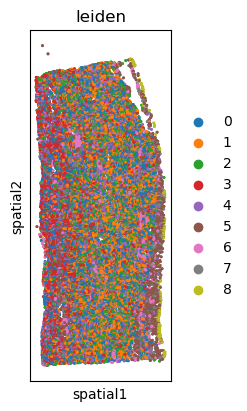

In [24]:
sq.pl.spatial_scatter(adata, library_id="spatial", shape=None, color=["leiden"], wspace=0.4)

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:744: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if c is not None and c in adata.obs and is_categorical_dtype(adata.obs[c]):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:472: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:650: FutureWarning: is_categorical_dtype is deprecated and will b

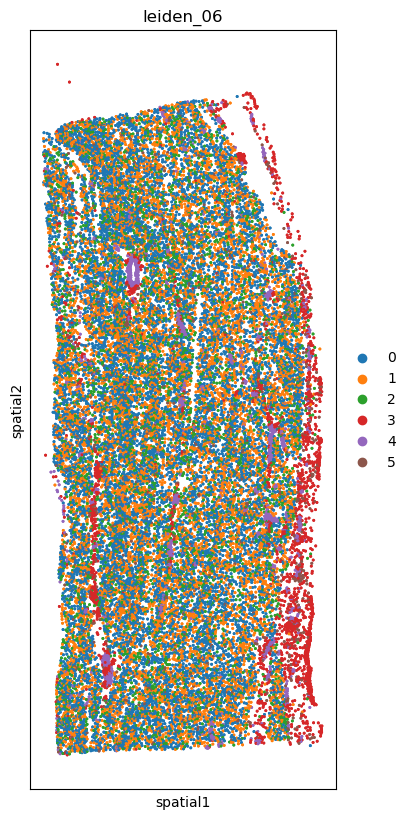

In [26]:
plt.rcParams["figure.figsize"] = (4, 12)
sq.pl.spatial_scatter(adata, library_id="spatial", shape=None, color=["leiden_06"], wspace=0.4)

### Manual cell type annotation

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


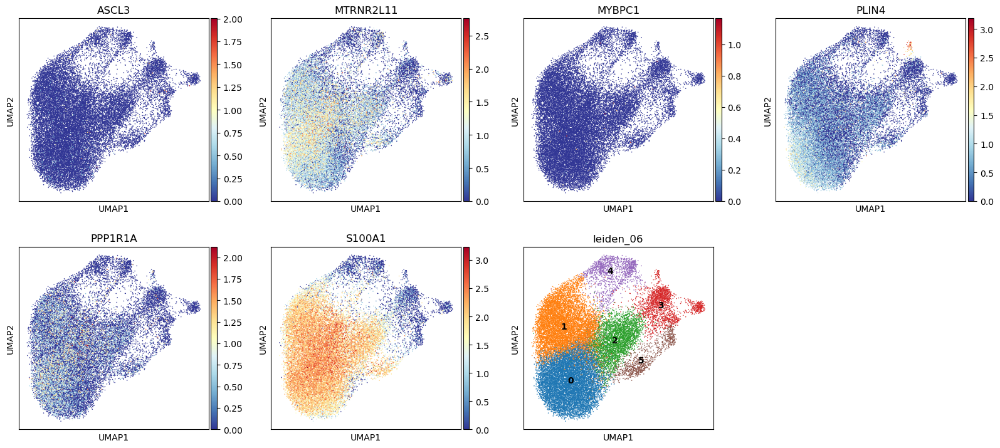

In [33]:
# Cardiomyocytes
sc.pl.umap(adata, color=["ASCL3", "MTRNR2L11", "MYBPC1", "PLIN4", "PPP1R1A", "S100A1", "leiden_06"], legend_loc="on data", size=5, color_map="RdYlBu_r")

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


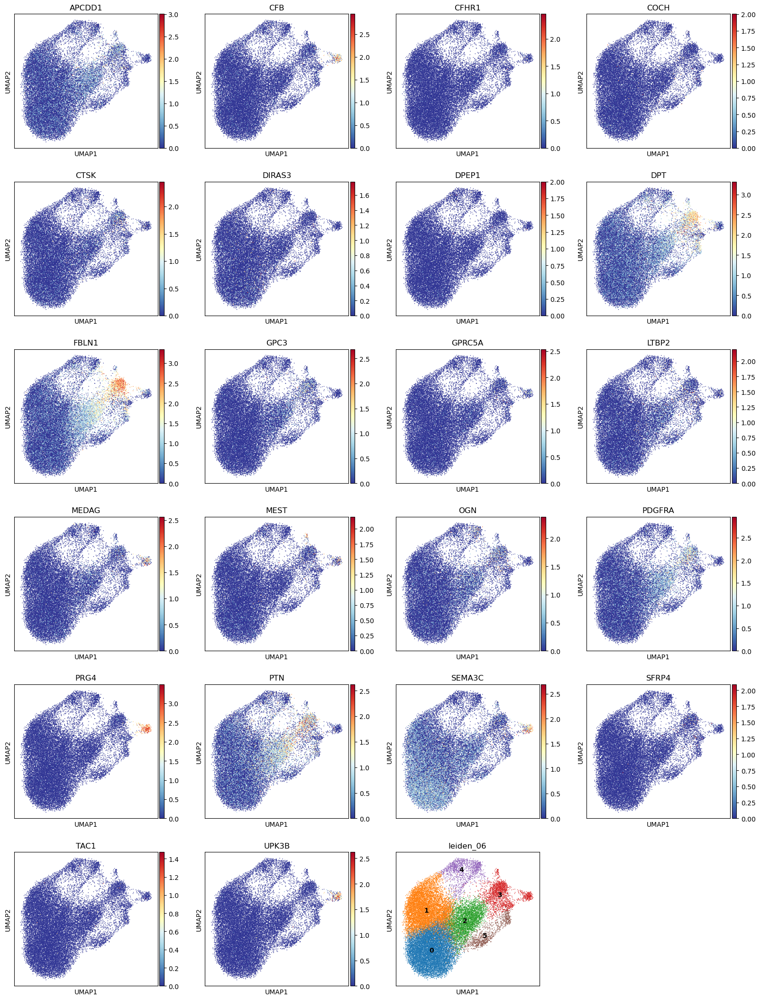

In [35]:
# Fibroblasts
sc.pl.umap(adata, color=["APCDD1", "CFB", "CFHR1", "COCH", "CTSK", "DIRAS3", "DPEP1", "DPT", "FBLN1", "GPC3", "GPRC5A", "LTBP2", 
                         "MEDAG", "MEST", "OGN", "PDGFRA", "PRG4", "PTN", "SEMA3C", "SFRP4", "TAC1", "UPK3B", "leiden_06"], 
                         legend_loc="on data", size=5, color_map="RdYlBu_r")

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


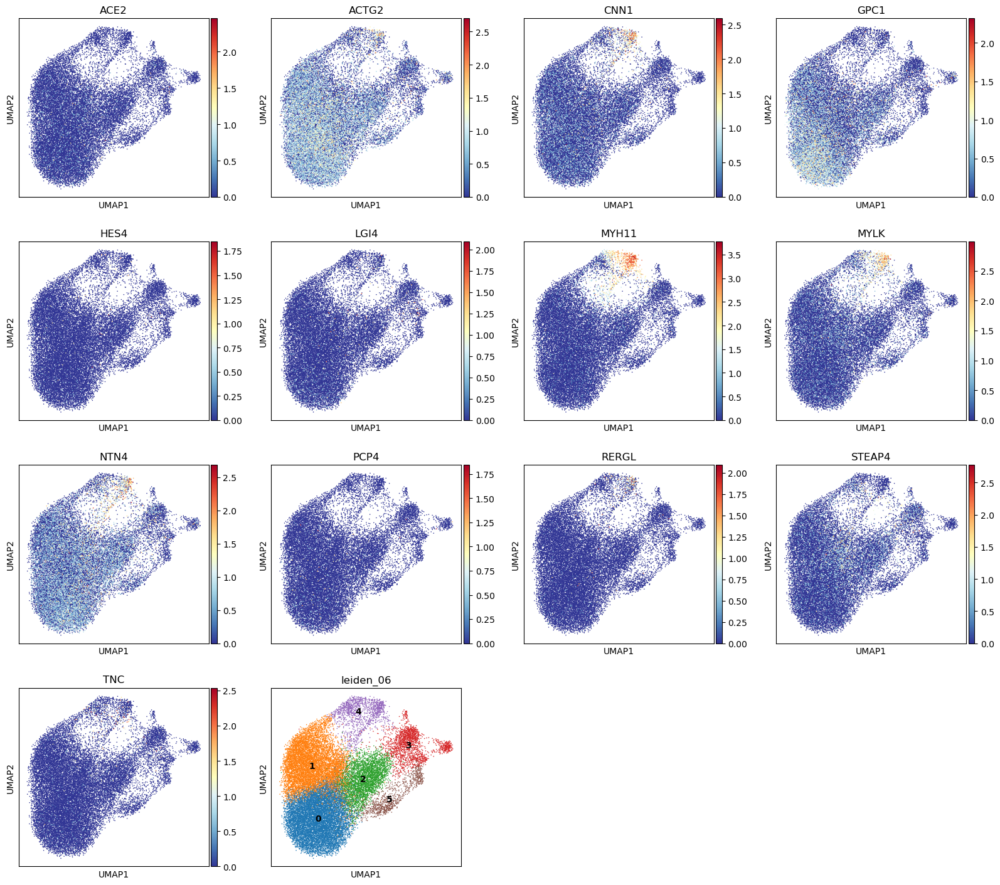

In [36]:
# Smooth muscle cells
sc.pl.umap(adata, color=["ACE2", "ACTG2", "CNN1", "GPC1", "HES4", "LGI4", "MYH11", "MYLK", "NTN4", "PCP4", "RERGL", "STEAP4", "TNC", "leiden_06"], legend_loc="on data", size=5, color_map="RdYlBu_r")

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


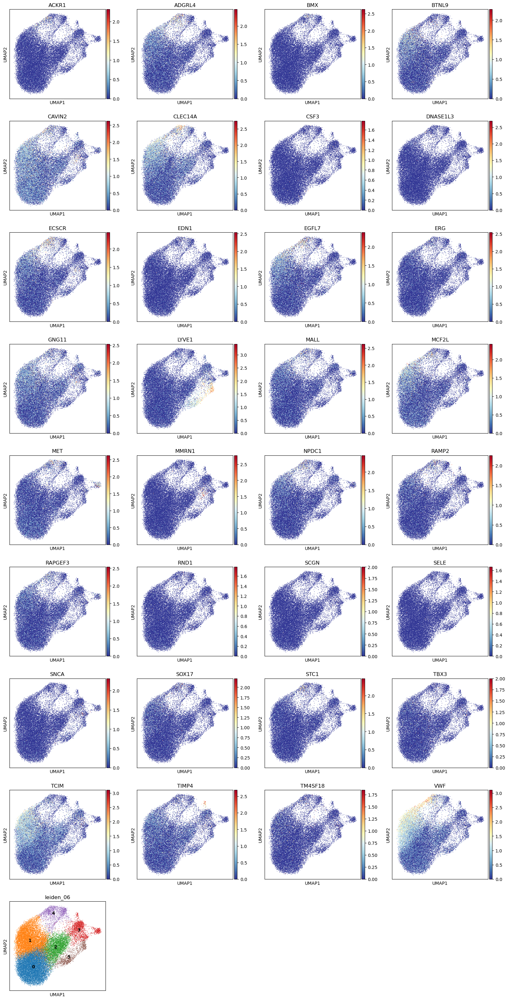

In [37]:
# Endothelial cells
sc.pl.umap(adata, color=["ACKR1", "ADGRL4", "BMX", "BTNL9", "CAVIN2", "CLEC14A", "CSF3", "DNASE1L3", "ECSCR", "EDN1", "EGFL7", "ERG", "GNG11", "LYVE1", "MALL", "MCF2L", 
                         "MET", "MMRN1", "NPDC1", "RAMP2", "RAPGEF3", "RND1", "SCGN", "SELE", "SNCA", "SOX17", "STC1", "TBX3", "TCIM", "TIMP4", "TM4SF18", "VWF", "leiden_06"], 
                         legend_loc="on data", size=5, color_map="RdYlBu_r")

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


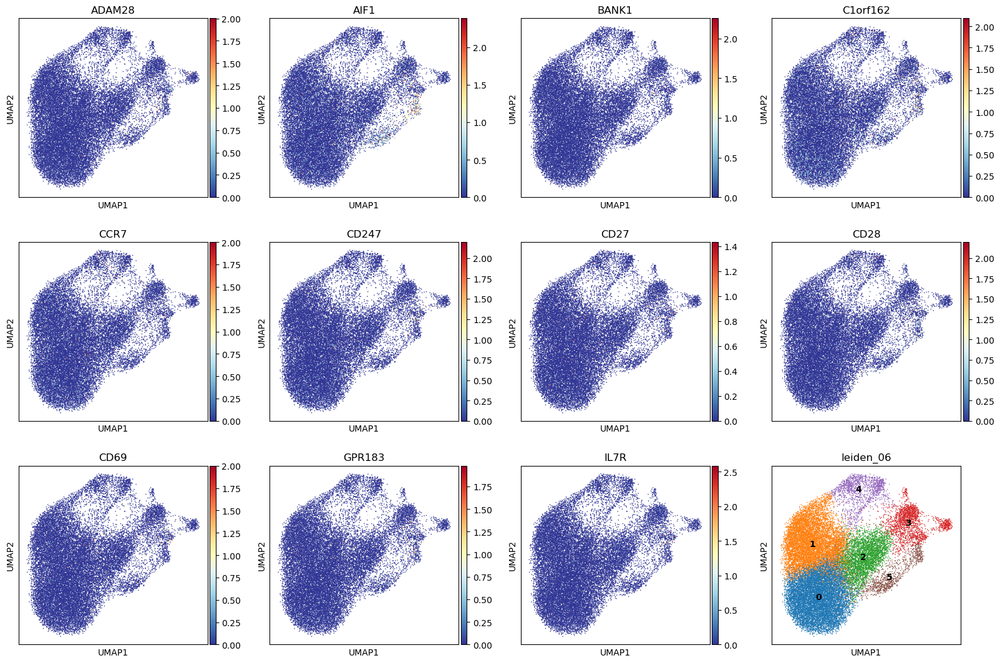

In [39]:
# Immune cells
sc.pl.umap(adata, color=["ADAM28", "AIF1", "BANK1", "C1orf162", "CCR7", "CD247", "CD27", "CD28", "CD69", "GPR183", "IL7R", "leiden_06"], legend_loc="on data", size=5, color_map="RdYlBu_r")

In [40]:
labels = {"0": "Cardiomyocytes", "1": "Cardiomyocytes", "2": "Cardiomyocytes", "3": "Fibroblasts", "4": "Smooth muscle cells", "5": "-"}

In [41]:
adata.obs["cell_type"] = adata.obs["leiden_06"].map(labels) # assign cell type labels to individual cells in adata

In [42]:
adata.obs["cell_type"]

aaaceakg-1    Cardiomyocytes
aaaddlck-1    Cardiomyocytes
aaaebcid-1    Cardiomyocytes
aaaeejcj-1    Cardiomyocytes
aaahoahg-1    Cardiomyocytes
                   ...      
oioehaij-1    Cardiomyocytes
oiofflob-1    Cardiomyocytes
oioflmpd-1    Cardiomyocytes
oiohpmcb-1    Cardiomyocytes
oiomaodo-1    Cardiomyocytes
Name: cell_type, Length: 25726, dtype: object

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


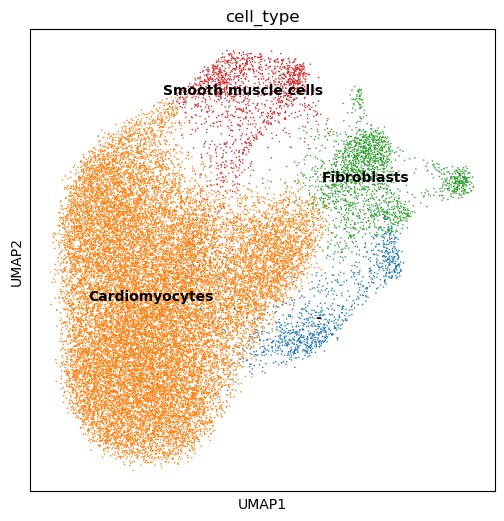

In [47]:
plt.rcParams["figure.figsize"] = (6, 6)
sc.pl.umap(adata, color=["cell_type"], legend_loc="on data")

/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:744: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if c is not None and c in adata.obs and is_categorical_dtype(adata.obs[c]):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:472: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/Users/phoebe/opt/anaconda3/envs/spatial/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:650: FutureWarning: is_categorical_dtype is deprecated and will b

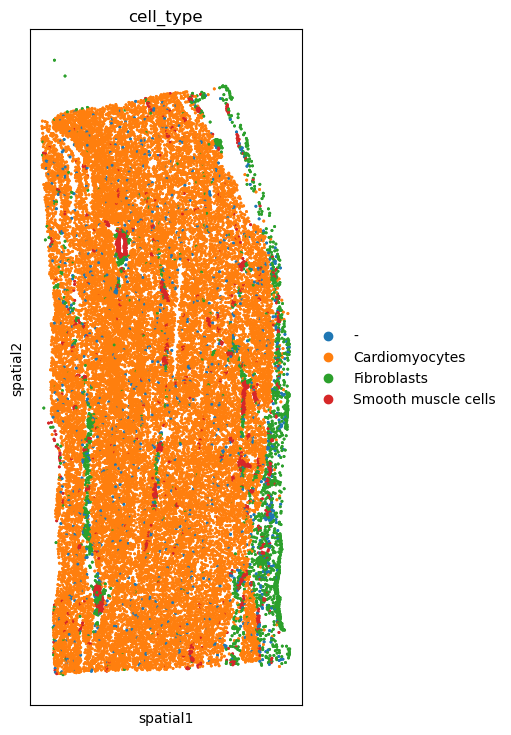

In [53]:
plt.rcParams["figure.figsize"] = (5, 15)
sq.pl.spatial_scatter(adata, library_id="spatial", shape=None, color=["cell_type"])